# 1. 준비
## 1.1. 라이브러리 로드

In [1]:
import os
from typing import Tuple, List, Sequence, Callable

import cv2
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm

import torch

from torch import nn, Tensor
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader, ConcatDataset
from torchvision.models import mobilenet_v2
from torchvision.models import resnet101

# from torchvision.models.detection import keypointrcnn_resnet50_fpn
from torchvision.models.detection.rpn import AnchorGenerator
from torchvision.ops import MultiScaleRoIAlign
from torchvision.models.detection import KeypointRCNN
from torch.utils.data.sampler import SubsetRandomSampler

!pip install -U git+https://github.com/albu/albumentations
import albumentations as A
from albumentations.pytorch import ToTensorV2

  Cloning https://github.com/albu/albumentations to /tmp/pip-req-build-63_ljidi
  Running command git clone -q https://github.com/albu/albumentations /tmp/pip-req-build-63_ljidi
     |████████████████████████████████| 952kB 6.5MB/s 
  Created wheel for albumentations: filename=albumentations-0.5.2-cp37-none-any.whl size=88321 sha256=96b0e599a4f2e5c6e4ee2f57cabadfe6b61890eee791e17beaddff22dd4e3093
  Stored in directory: /tmp/pip-ephem-wheel-cache-8p7_9ulv/wheels/45/8b/e4/2837bbcf517d00732b8e394f8646f22b8723ac00993230188b
Successfully built albumentations
  Found existing installation: imgaug 0.2.9
    Uninstalling imgaug-0.2.9:
      Successfully uninstalled imgaug-0.2.9
  Found existing installation: albumentations 0.1.12
    Uninstalling albumentations-0.1.12:
      Successfully uninstalled albumentations-0.1.12


## 1.2 Google Drives 연결

In [2]:
from google.colab import drive
drive.mount('/content/gdrive/')

import os
os.chdir('/content/gdrive/Shared drives/keypoint/') # MyDrive/motion_keypoint/... (공유 풀더 위치)

Mounted at /content/gdrive/


In [3]:
# draw_keypoints
# 기존 함수에서 boxpoints 추가함.
# boxpoints = [] 로 비워두면 자동으로 keypoints 값 이용해서 min, max 값 생성..
# test data 의 경우 채워두면 predicted box points 사용 

edges = [
    (0, 1), (0, 2), (2, 4), (1, 3), (6, 8), (8, 10), (9, 18),
    (10, 19), (5, 7), (7, 9), (11, 13), (13, 15), (12, 14),
    (14, 16), (15, 22), (16, 23), (20, 21), (5, 6), (5, 11),
    (6, 12), (11, 12), (17, 20), (20, 21), 
]

#df2 = pd.read_csv('./data/mpii_cooc_label.csv')
df = pd.read_csv('./data/train_df2.csv')
keypoint_names = df.columns[1:].tolist()

def draw_keypoints(image: np.ndarray, keypoints: np.ndarray, boxpoints, edges: List[Tuple[int, int]]) -> None:
  """
  Args:
  image (ndarray): [H, W, C]
  keypoints (ndarray): [N, 3]
  edges (List(Tuple(int, int))):
  """
  np.random.seed(42)
  colors = {k: tuple(map(int, np.random.randint(0, 255, 3))) for k in range(24)}
  
  keypoints=keypoints.astype(np.int64)

  if len(boxpoints) == 0 :
    x1, y1 = min(keypoints[:, 0]), min(keypoints[:, 1])
    x2, y2 = max(keypoints[:, 0]), max(keypoints[:, 1]) 
  else :
    x1 = boxpoints[0]; y1 = boxpoints[1]; 
    x2 = boxpoints[2]; y2 = boxpoints[3];

  print(x1, y1, x2, y2)
  cv2.rectangle(image, (int(x1), int(y1)), (int(x2), int(y2)), (255, 100, 91), thickness=3)

  for i, keypoint in enumerate(keypoints):
    cv2.circle(image, tuple(keypoint),
               3, colors.get(i), thickness=3, lineType=cv2.FILLED)
    
#    cv2.putText(image, f'{i}: {keypoint_names[i]}',
#                tuple(keypoint),
#                cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 0, 0), 1)
    
#    for i, edge in enumerate(edges):
#      cv2.line(image, tuple(keypoints[edge[0]]),
#               tuple(keypoints[edge[1]]), colors.get(edge[0]), 3, lineType=cv2.LINE_AA)
    
  fig, ax = plt.subplots(dpi=200)
  ax.imshow(image)
  ax.axis('off')
  plt.show()
  # fig.savefig('example.png')

In [4]:
df.head()

,image,nose_x,nose_y,left_eye_x,left_eye_y,right_eye_x,right_eye_y,left_ear_x,left_ear_y,right_ear_x,right_ear_y,left_shoulder_x,left_shoulder_y,right_shoulder_x,right_shoulder_y,left_elbow_x,left_elbow_y,right_elbow_x,right_elbow_y,left_wrist_x,left_wrist_y,right_wrist_x,right_wrist_y,left_hip_x,left_hip_y,right_hip_x,right_hip_y,left_knee_x,left_knee_y,right_knee_x,right_knee_y,left_ankle_x,left_ankle_y,right_ankle_x,right_ankle_y,neck_x,neck_y,left_palm_x,left_palm_y,right_palm_x,right_palm_y,spine2(back)_x,spine2(back)_y,spine1(waist)_x,spine1(waist)_y,left_instep_x,left_instep_y,right_instep_x,right_instep_y
0,001-1-1-01-Z17_A-0000001.jpg,1046.389631,344.757881,1041.655294,329.820225,1059.429507,334.484230,1020.117796,338.890539,1048.000000,343.000000,992.0,394.0,1054.0,400.0,956.000000,368.000000,1134.0,371.0,1003.497242,327.640085,1078.000000,341.00000,999.0,570.0,1046.0,573.0,995.0,695.0,1054.0,698.0,983.000000,820.000000,1042.0,829.0,1019.107277,373.766221,1013.137360,316.311695,1067.000000,335.000000,1019.484229,455.000000,1026.515770,514.054730,998.578836,826.718013,1063.204067,838.827465
1,001-1-1-01-Z17_A-0000003.jpg,1069.850679,340.711494,1058.608552,324.593690,1075.242111,325.593690,1041.422997,331.694815,1065.593682,333.968459,1010.0,398.0,1077.0,386.0,974.000000,398.000000,1144.0,337.0,1004.000000,346.000000,1094.000000,326.00000,1020.0,557.0,1069.0,567.0,1013.0,583.0,1072.0,697.0,1003.843781,678.797029,1042.0,829.0,1047.279440,362.031898,1017.383112,332.890539,1081.187380,323.000000,1046.953248,454.062706,1058.766231,508.797029,1002.265676,699.062706,1066.376234,841.499445
2,001-1-1-01-Z17_A-0000005.jpg,1084.475902,337.000008,1078.717997,323.757889,1095.648412,325.242119,1061.039884,329.351571,1086.461032,334.109461,1020.0,381.0,1083.0,389.0,984.000000,362.000000,1163.0,372.0,1027.507419,327.383120,1111.000000,340.00000,1016.0,552.0,1061.0,556.0,1018.0,674.0,1070.0,696.0,987.703151,788.867342,1044.0,826.0,1063.029716,358.679953,1042.374777,319.031541,1101.000000,334.000000,1044.538960,442.054730,1052.844144,495.890539,989.437847,808.757889,1066.071417,841.749554
3,001-1-1-01-Z17_A-0000007.jpg,1042.320047,361.452689,1037.907194,344.117804,1050.328382,353.913729,1016.844144,340.913737,1042.164191,359.351579,968.0,392.0,1010.0,411.0,941.812612,339.703151,1109.0,441.0,971.654931,328.648429,1066.812604,383.40631,972.0,571.0,1000.0,559.0,991.0,700.0,1110.0,469.0,991.406302,816.132650,1133.0,591.0,1007.302983,374.179405,981.842327,329.109461,1057.406318,372.461040,982.937294,458.109462,990.375124,507.624866,1001.305177,829.233767,1159.516499,599.389997
4,001-1-1-01-Z17_A-0000009.jpg,1058.046395,343.164191,1046.717997,331.703163,1058.132650,331.781079,1031.258806,338.593690,1049.812620,338.187380,997.0,393.0,1054.0,395.0,961.000000,423.000000,1132.0,360.0,988.676303,357.688297,1080.000000,337.00000,1000.0,567.0,1043.0,570.0,1017.0,673.0,1059.0,701.0,998.406302,784.570501,1040.0,827.0,1036.318945,366.195727,999.777421,349.829291,1069.648429,334.109461,1024.843791,453.687572,1034.391088,510.843791,998.625231,805.218921,1059.625956,839.765102


In [5]:
print(df.shape)

(4094, 49)


In [6]:
mpii_info = pd.read_csv('./data/train_df3.csv')

In [7]:
motion_key = ["left_shoulder_x", "left_shoulder_y",
               "right_shoulder_x", "right_shoulder_y",
               "left_elbow_x", "left_elbow_y",
               "right_elbow_x", "right_elbow_y",
               "left_wrist_x", "left_wrist_y",
               "right_wrist_x", "right_wrist_y",
               "left_hip_x", "left_hip_y",
               "right_hip_x", "right_hip_y",
               "left_knee_x", "left_knee_y",
               "right_knee_x", "right_knee_y",
               "left_ankle_x", "left_ankle_y",
               "right_ankle_x", "right_ankle_y",
               "neck_x", "neck_y",
               "spine2(back)_x", "spine2(back)_y",
               "spine1(waist)_x", "spine1(waist)_y"]

print(len(motion_key))
             
# left_sholuder
motion_vis = ["left_shoulde", "right_shoulder", "left_elbow", "right_elbow", "left_wrist", "right_wrist", "left_hip", "right_hip", "left_knee", "right_knee", "left_ankle", "right_ankle", "neck", "spine2(back)", "spine1(waist)"]

print(mpii_info.shape)
print(mpii_info[motion_key].shape)
print(mpii_info[motion_vis].shape)


30
(2094, 46)
(2094, 30)
(2094, 15)


In [8]:
mpii_info.head()

,image,left_shoulder_x,left_shoulder_y,right_shoulder_x,right_shoulder_y,left_elbow_x,left_elbow_y,right_elbow_x,right_elbow_y,left_wrist_x,left_wrist_y,right_wrist_x,right_wrist_y,left_hip_x,left_hip_y,right_hip_x,right_hip_y,left_knee_x,left_knee_y,right_knee_x,right_knee_y,left_ankle_x,left_ankle_y,right_ankle_x,right_ankle_y,neck_x,neck_y,spine2(back)_x,spine2(back)_y,spine1(waist)_x,spine1(waist)_y,left_shoulde,right_shoulder,left_elbow,right_elbow,left_wrist,right_wrist,left_hip,right_hip,left_knee,right_knee,left_ankle,right_ankle,neck,spine2(back),spine1(waist)
0,036636184.jpg,516,48,459,104,588,132,469,201,587,242,416,251,570,204,517,220,574,371,529,369,581,480,525,478,479.0873,71.5436,488,76,544,212,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
1,045606998.jpg,566,187,464,170,671,230,470,285,591,316,495,361,645,140,559,255,600,343,568,298,610,480,555,370,508.3448,181.3768,515,179,602,198,1,0,1,1,1,1,1,0,1,0,1,0,0,0,0
2,060754485.jpg,698,217,600,242,767,310,551,307,790,405,488,351,747,421,670,437,751,574,685,579,768,717,694,684,642.6337,217.5659,649,230,709,429,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
3,017052412.jpg,636,220,553,217,616,329,526,310,529,353,495,354,748,369,639,374,727,532,663,528,727,666,679,637,592.5583,210.0951,595,219,694,372,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1
4,094888554.jpg,907,404,844,390,898,460,817,441,862,504,775,457,900,515,830,500,895,593,841,595,912,691,836,666,875.7539,390.6023,876,397,865,508,1,1,1,1,1,1,1,1,1,1,1,1,0,1,1


In [9]:
# cut off 참고 : # https://github.com/uoguelph-mlrg/Cutout/blob/master/util/cutout.py
# p=0.5 의 확률로 cutout image를 생성함 / 패치 크기는 150x150 으로 고정
class MotionDataset(Dataset):
  def __init__(self, label_df, transforms=None) :
      self.df = label_df
      self.transforms = transforms
  
  def __len__(self) -> int:
    return self.df.shape[0]
    
  def __getitem__(self,index: int) -> Tuple[Tensor]:
#    print(index)
    image_dir = self.df.iloc[index,]['path']
    image_id = self.df.iloc[index,]['image']
    data_type = self.df.iloc[index,]['type']
    
    labels = np.array([1]) 
    keypoints = self.df.iloc[index, ][motion_key].values.reshape(-1, 2).astype(np.int64)

    x1, y1 = min(keypoints[:, 0]), min(keypoints[:, 1])
    x2, y2 = max(keypoints[:, 0]), max(keypoints[:, 1])
    boxes = np.array([[x1, y1, x2, y2]], dtype=np.int64)
    
    image = cv2.imread(os.path.join(image_dir, image_id), cv2.COLOR_BGR2RGB)
    visible = np.ones((15, 1))
    
    # keypoints-aware occlusion p=0.5
    cutout = np.random.randint(0,2)
    if cutout == 1:
      h = image.shape[0]
      w = image.shape[1]

      item = np.random.randint(0,15)
#      item = np.random.randint(0,24)
      initx, inity = keypoints[item]
      size = np.random.randint(200, 300)

      image = cv2.rectangle(image, (initx-size, inity-size), (initx+size, inity+size), (0,0,0), -1)
#      for i, keypoint in enumerate(keypoints):
#        invis_check = sum([initx, inity-size] < keypoint) + sum(keypoint < [initx+size, inity])
#        if invis_check == 4:
#          visible[i]=0

    targets ={
        'image': image,
        'bboxes': boxes,
        'labels': labels,
        'keypoints': keypoints
    }
    
    if self.transforms is not None:
      targets = self.transforms(**targets)
      
    image = targets['image']
    image = image / 255.0

    targets = {
        'labels': torch.as_tensor(targets['labels'], dtype=torch.int64),
        'boxes': torch.as_tensor(targets['bboxes'], dtype=torch.float32),
        'keypoints': torch.as_tensor(
                np.concatenate([targets['keypoints'], visible], axis=1)[np.newaxis], dtype=torch.float32 )
        }

    return image, targets

In [10]:
def check_bbox(bbox):
    """Check if bbox boundaries are in range 0, 1 and minimums are lesser then maximums"""
    for name, value in zip(["x_min", "y_min", "x_max", "y_max"], bbox[:4]):
        if not 0 <= value <= 1:
          bbox=list(bbox)
          for i in range(4):
            if (bbox[i]<0) :
              bbox[i]=0.00001
            elif (bbox[i]>1) :
              bbox[i]=0.99999
          bbox=tuple(bbox)
   #end of block
    x_min, y_min, x_max, y_max = bbox[:4]
    if x_max <= x_min:
        raise ValueError("x_max is less than or equal to x_min for bbox {bbox}.".format(bbox=bbox))
    if y_max <= y_min:
        raise ValueError("y_max is less than or equal to y_min for bbox {bbox}.".format(bbox=bbox))

A.bbox_utils.check_bbox = check_bbox

In [11]:
# https://github.com/aleju/imgaug
# https://imgaug.readthedocs.io/en/latest/source/overview/blur.html#gaussianblur
transform1 = A.Compose([A.Rotate(limit=45, p=1.0),
                       A.OneOf([A.MedianBlur(p=1.0),
                                A.ImageCompression(p=1.0),
                       ],p=0.5),
#                       A.VerticalFlip(p=0.5),
                       A.RandomScale(scale_limit=0.15, p=1.0),
                       ToTensorV2(),
                       ],
                      bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']),
                      keypoint_params=A.KeypointParams(format='xy', remove_invisible=False))

transform_val = A.Compose([ToTensorV2(),
                       ],
                      bbox_params=A.BboxParams(format='pascal_voc', label_fields=['labels']),
                      keypoint_params=A.KeypointParams(format='xy', remove_invisible=False))

In [12]:
def collate_fn(batch: torch.Tensor) -> Tuple:
    return tuple(zip(*batch))

train_path = './data/train_imgs/'
train_df = pd.read_csv('./data/relabel_all_df.csv')
train_df = pd.read_csv('./data/train_df2.csv')
train_df['path'] = train_path
train_df['type'] = "dacon"

mpii_path = './data/external_labeled/exter_imgs/images/'
mpii_info['path'] = mpii_path
mpii_info['type'] = "mpii"

train_all = pd.concat([train_df, mpii_info], ignore_index=True) 

In [13]:
# R-CNN
def get_model() -> nn.Module:
    mode = resnet101(pretrained=True)
    backbone = nn.Sequential(*(list(nn.Module.children(mode))[0:8]))
    backbone.out_channels = 2048
    
    roi_pooler = MultiScaleRoIAlign(
        featmap_names=['0'],
        output_size=7,
        sampling_ratio=2
    )

    anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))
    
    keypoint_roi_pooler = MultiScaleRoIAlign(
        featmap_names=['0'],
        output_size=14,
        sampling_ratio=2
    )

    model = KeypointRCNN(
        backbone, 
        num_classes=2,
        num_keypoints=15,
        box_roi_pool=roi_pooler,
        keypoint_roi_pool=keypoint_roi_pooler,
        rpn_anchor_generator=anchor_generator
    )

    return model

In [14]:
import random
from tqdm import tqdm
from sklearn.model_selection import KFold
def seed_everything(seed):
    random.seed(seed)
    os.environ["PYTHONHASHSEED"] = str(seed)
    np.random.seed(seed)
    torch.manual_seed(seed)
    torch.cuda.manual_seed_all(seed)
    torch.backends.cudnn.deterministic = True

# FOLD 1

In [15]:
# 5-CV 추가
# 참고 : https://dacon.io/competitions/official/235697/codeshare/2446?page=1&dtype=recent
num_epochs = 20
SEED = 403
lam=2**(-20)
device='cuda:0'

# cross validation을 적용하기 위해 KFold 생성
kfold = KFold(n_splits=5, shuffle=True, random_state=SEED)

# dirty_mnist_answer에서 train_idx와 val_idx를 생성
#best_models = [] # 폴드별로 가장 validation acc가 높은 모델 저장

for fold_index, (trn_idx, val_idx) in enumerate(kfold.split( train_all ),1):
    if fold_index == 1 :
      break

print(trn_idx)
print(val_idx)

[   0    1    3 ... 6181 6182 6184]
[   2    4   13 ... 6185 6186 6187]


In [16]:
EARLY_STOPPING_EPOCH = 3

In [17]:
# for fold_index, (trn_idx, val_idx) in enumerate(kfold.split( train_all ),1):

seed_everything(SEED)
print(f' == fold: {fold_index} == ')

# cuda cache 초기화
torch.cuda.empty_cache()

#train fold, validation fold 분할
trainset = train_all.iloc[trn_idx]
validset  = train_all.iloc[val_idx]

#Dataset 정의
train_data = MotionDataset(label_df=trainset, transforms=transform1)
valid_data = MotionDataset(label_df=validset, transforms=transform_val)

#DataLoader 정의
train_loader = DataLoader(train_data, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)
valid_loader = DataLoader(valid_data, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)

# 모델 선언
model = get_model()
model.to(device)# gpu에 모델 할당

optimizer = optim.SGD(model.parameters(), lr=1e-4, momentum=0.9, weight_decay=5e-4)
lr_sched = torch.optim.lr_scheduler.StepLR(optimizer, step_size=8, gamma=0.1)

valid_early_stop = 0
valid_best_loss = float('inf')

for epoch in range(num_epochs):  
  model.train()
  for i, (images, targets) in enumerate(train_loader):
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    optimizer.zero_grad()
    model.train()
    losses = model(images, targets)
    loss = sum(loss for loss in losses.values())
    
    L2=0
    for param in model.parameters():
      L2 += torch.norm(param, p=2)
      loss = loss + lam * L2

    loss.backward()
    optimizer.step()

    if (i+1) % 20 == 0:
      print(f'| epoch: {epoch} | Train loss: {loss.item():.4f}', end=' | ')
      for k, v in losses.items():
        print(f'{k[5:]}: {v.item():.4f}', end=' | ')
      print()
  
  # Learning rate 조절
  lr_sched.step()

  if epoch < 1 : 
    continue

  valid_loss_list = []
  for i, (images, targets) in enumerate(valid_loader):
    optimizer.zero_grad()
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
      
    with torch.no_grad():
      lossesV  = model(images, targets)
      lossV = sum(loss for loss in lossesV.values())
      L2=0
      for param in model.parameters():
        L2 += torch.norm(param,p=2)
      lossV = lossV + lam * L2

      valid_loss_list.append(lossV)

    if (i+1) % 20 == 0:
      print(f'| epoch: {epoch} | Valid loss: {lossV.item():.4f}', end=' | ')
      for k, v in lossesV.items():
        print(f'{k[5:]}: {v.item():.4f}', end=' | ')
      print()

  val_mean_loss = np.mean(valid_loss_list, dtype="float64")
  print(f' > VALIDATION SET LOSS MEAN : {val_mean_loss : .4f}')
  
  # 모델 저장
  # 성능 변화 없는 에폭 3번 반복 -> Early stopping
  if val_mean_loss  < valid_best_loss :
    best_model = model
    MODEL = f"resnet101_{SEED}"
    # 경로 설정 필요
    path = f"./model/5CV/SEED_{SEED}/"
    try: 
      os.mkdir(path)
    except:
      None 
    torch.save(best_model.state_dict(), f'{path}fold{fold_index}]_{MODEL}_{val_mean_loss:2.4f}_epoch_{epoch}.pth')

  # early stopping    
  if val_mean_loss < valid_best_loss:
    valid_best_loss = val_mean_loss
    valid_early_stop = 0
  else:
    valid_early_stop += 1
    if valid_early_stop >= EARLY_STOPPING_EPOCH:
      print("EARLY_STOPPING!!")
      break


# 폴드별로 가장 좋은 모델 저장
# best_models.append(best_model)

 == fold: 1 == 


Downloading: "https://download.pytorch.org/models/resnet101-5d3b4d8f.pth" to /root/.cache/torch/hub/checkpoints/resnet101-5d3b4d8f.pth



| epoch: 0 | Train loss: 9.0268 | classifier: 0.1203 | box_reg: 0.0462 | keypoint: 8.0495 | objectness: 0.5957 | rpn_box_reg: 0.0265 | 
| epoch: 0 | Train loss: 8.5669 | classifier: 0.0588 | box_reg: 0.0012 | keypoint: 7.8689 | objectness: 0.4404 | rpn_box_reg: 0.0091 | 
| epoch: 0 | Train loss: 8.5175 | classifier: 0.0593 | box_reg: 0.0051 | keypoint: 7.8994 | objectness: 0.3464 | rpn_box_reg: 0.0188 | 
| epoch: 0 | Train loss: 8.5745 | classifier: 0.0682 | box_reg: 0.0301 | keypoint: 8.0083 | objectness: 0.2705 | rpn_box_reg: 0.0088 | 
| epoch: 0 | Train loss: 8.2779 | classifier: 0.0875 | box_reg: 0.0334 | keypoint: 7.7154 | objectness: 0.2393 | rpn_box_reg: 0.0136 | 
| epoch: 0 | Train loss: 8.1475 | classifier: 0.0686 | box_reg: 0.0191 | keypoint: 7.6341 | objectness: 0.2174 | rpn_box_reg: 0.0197 | 
| epoch: 0 | Train loss: 7.7031 | classifier: 0.0592 | box_reg: 0.0231 | keypoint: 7.2137 | objectness: 0.1947 | rpn_box_reg: 0.0238 | 
| epoch: 0 | Train loss: 8.1488 | classifier: 0

## 예측

In [18]:
submission = pd.read_csv('./data/sample_submission.csv')
submission.head()
submission.shape

(1600, 49)

0
702 316 1111 683


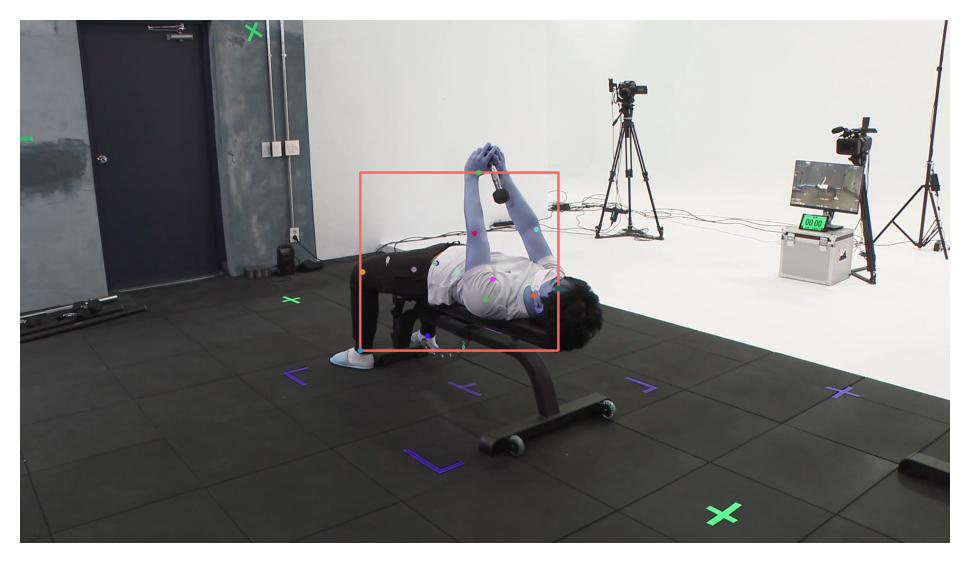

50
810 350 1258 847


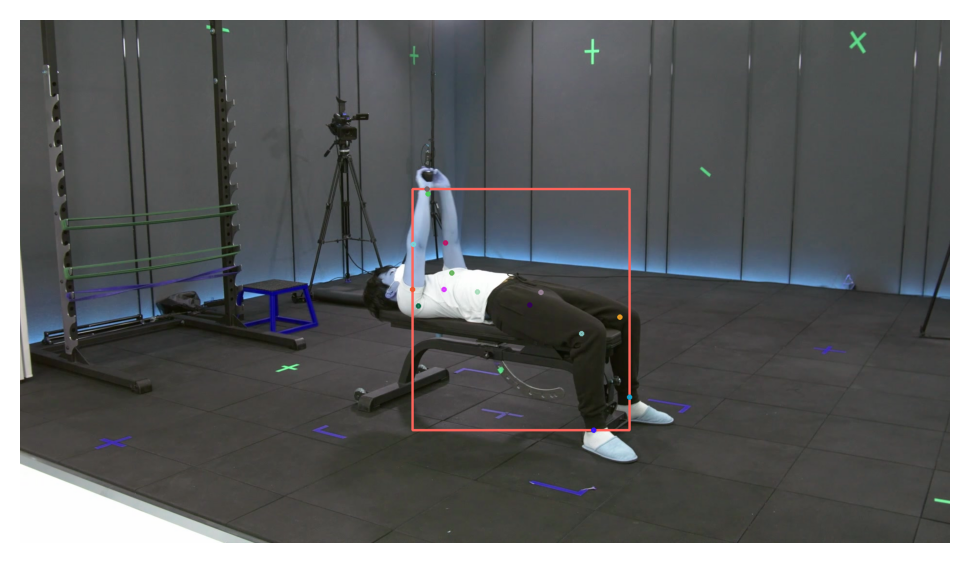

100
739 337 1260 745


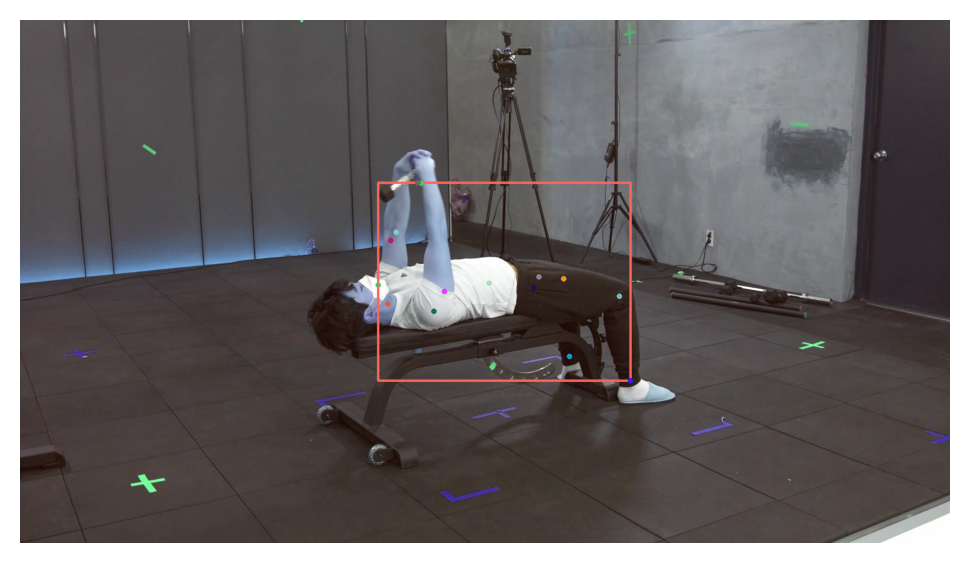

150
667 401 1248 853


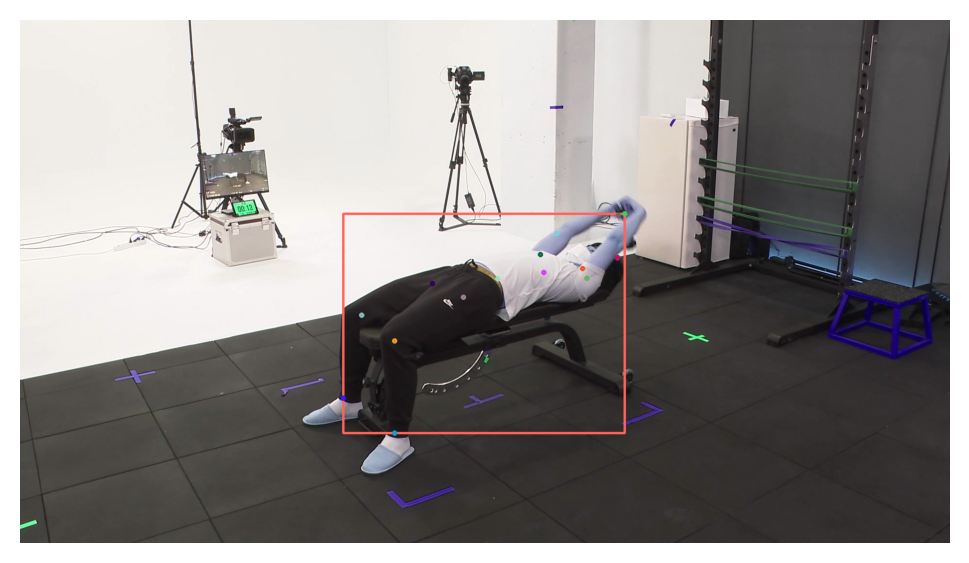

200
765 465 1293 772


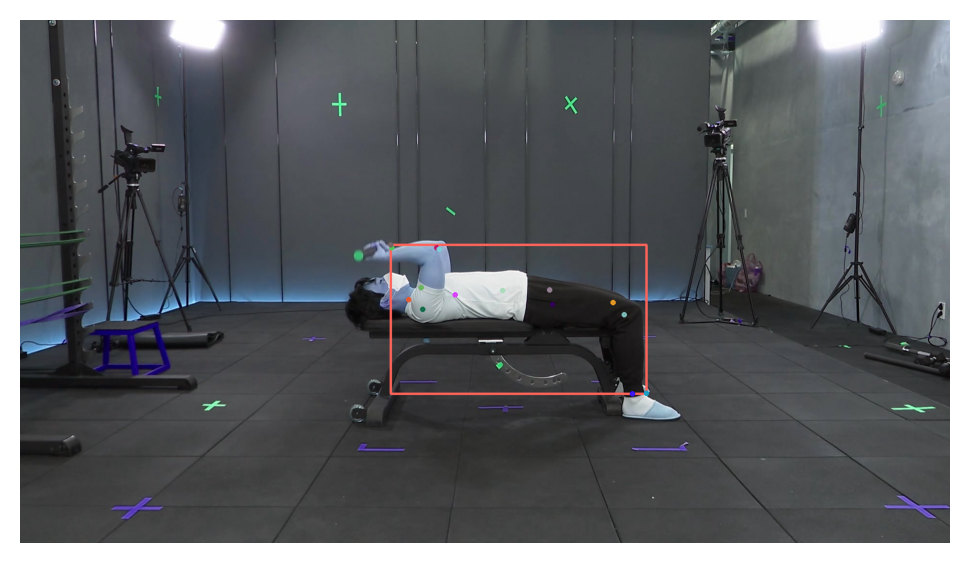

250
696 286 1095 680


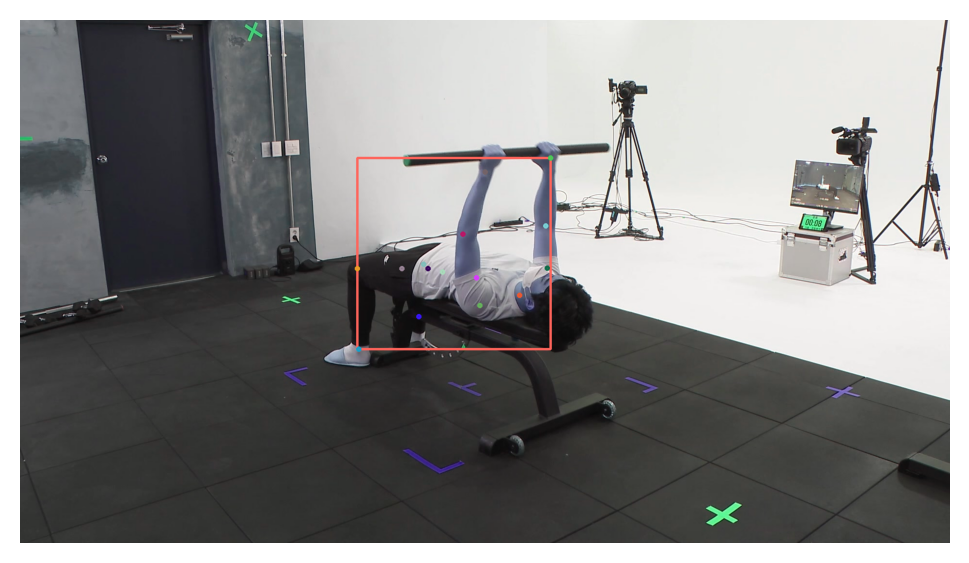

300
810 362 1285 840


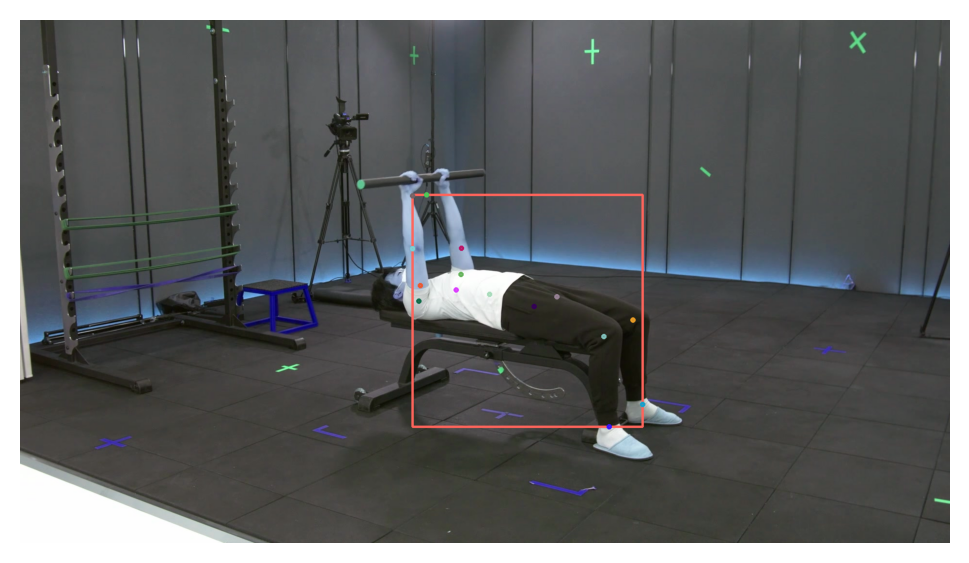

350
881 420 1063 803


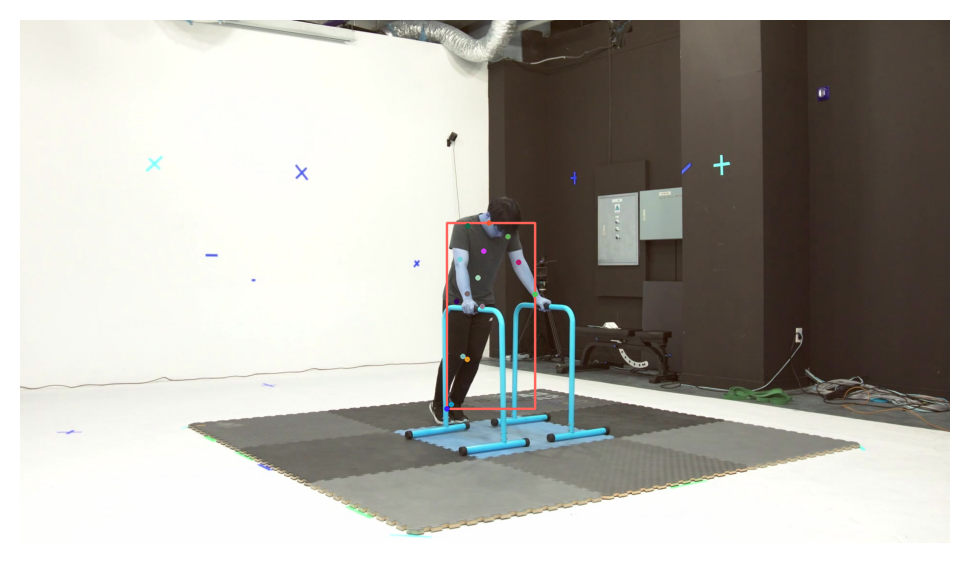

400
861 452 1122 920


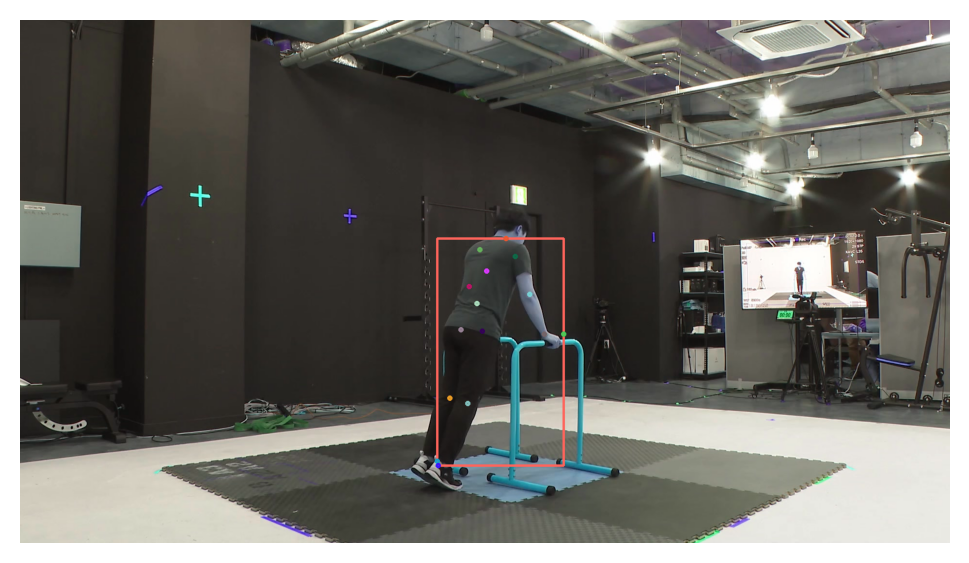

450
950 474 1101 795


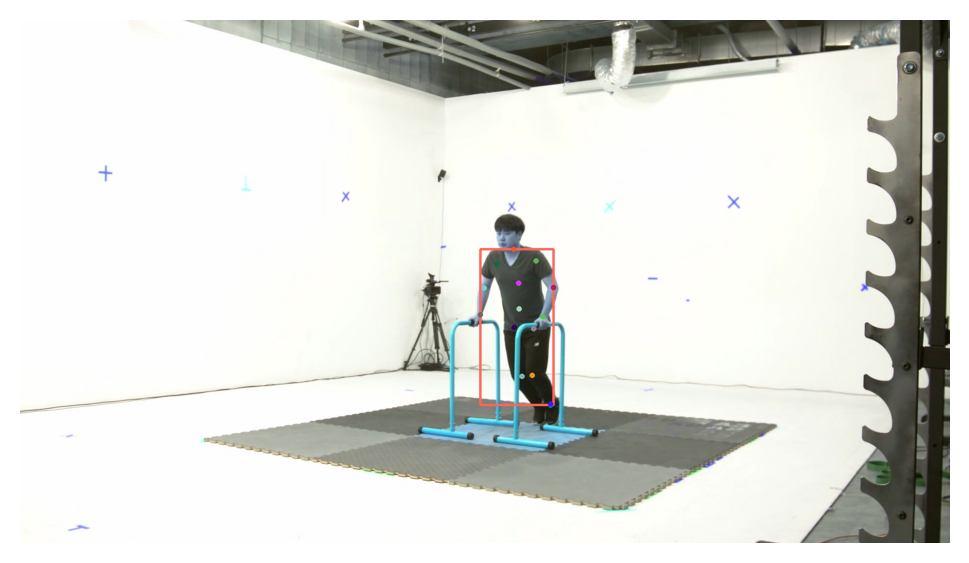

500
861 177 1075 641


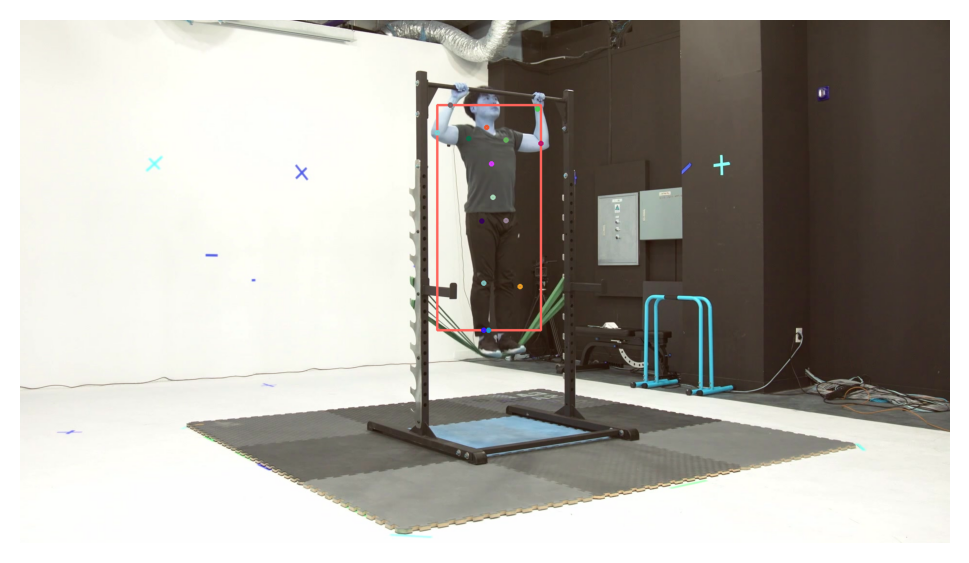

550
847 234 1056 766


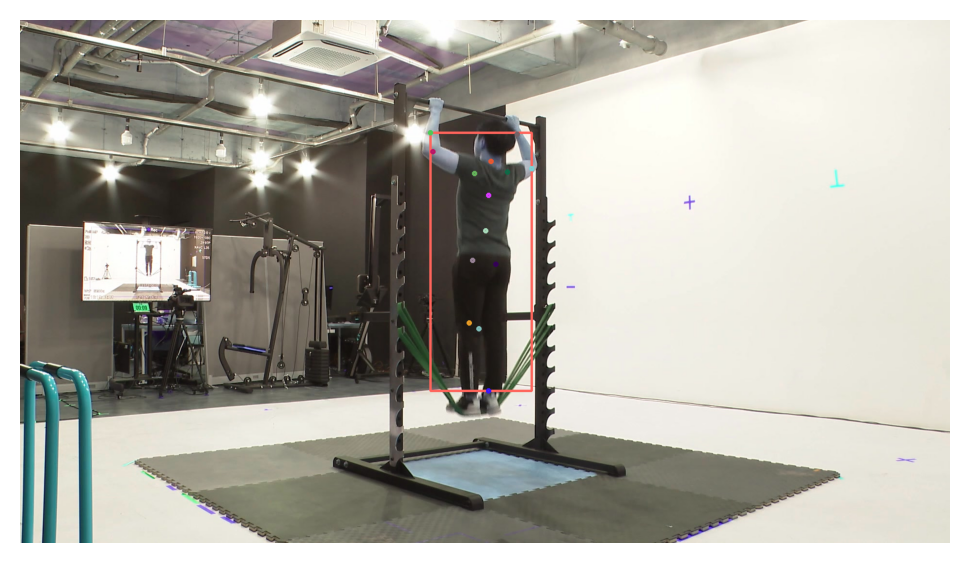

600
819 246 1043 681


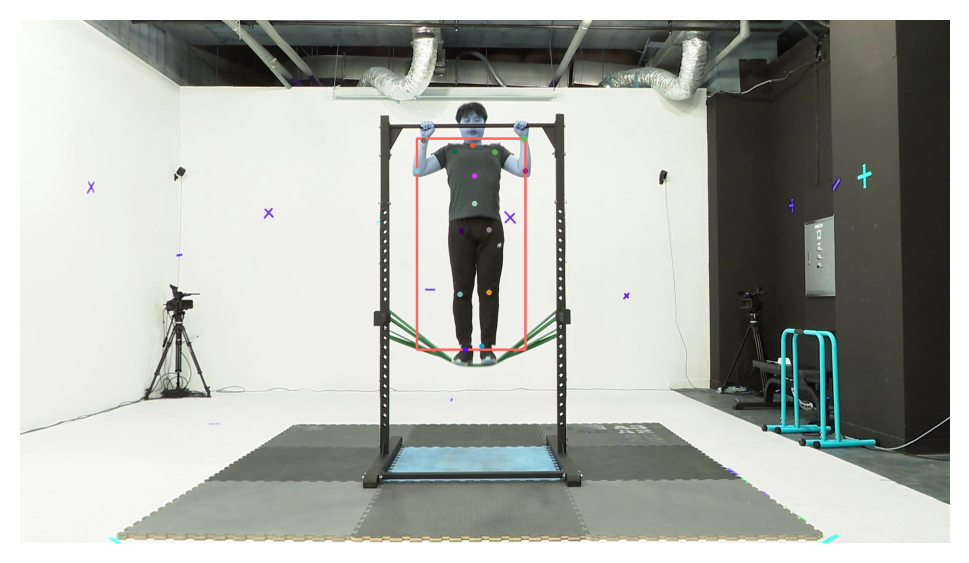

650
829 341 1010 769


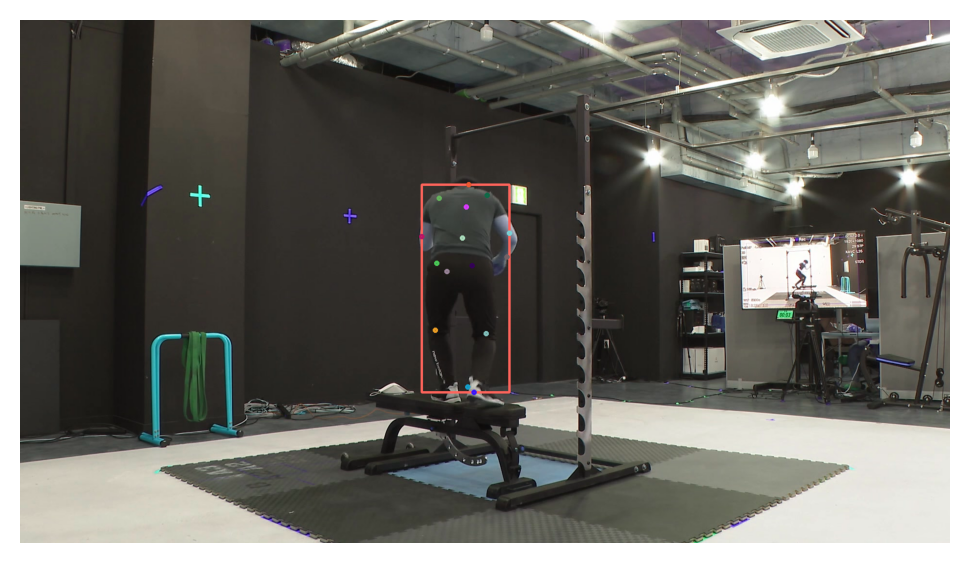

700
973 266 1102 700


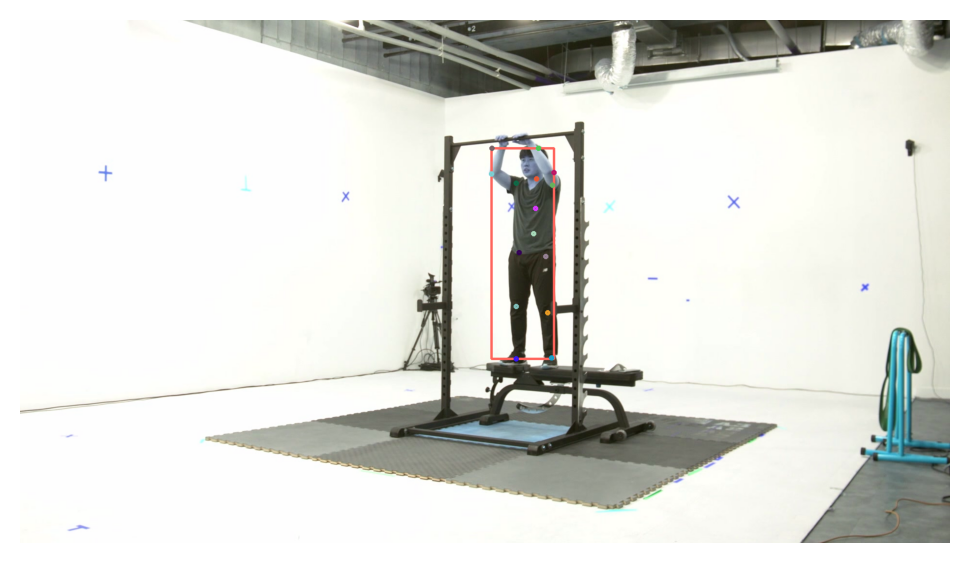

750
860 169 1062 656


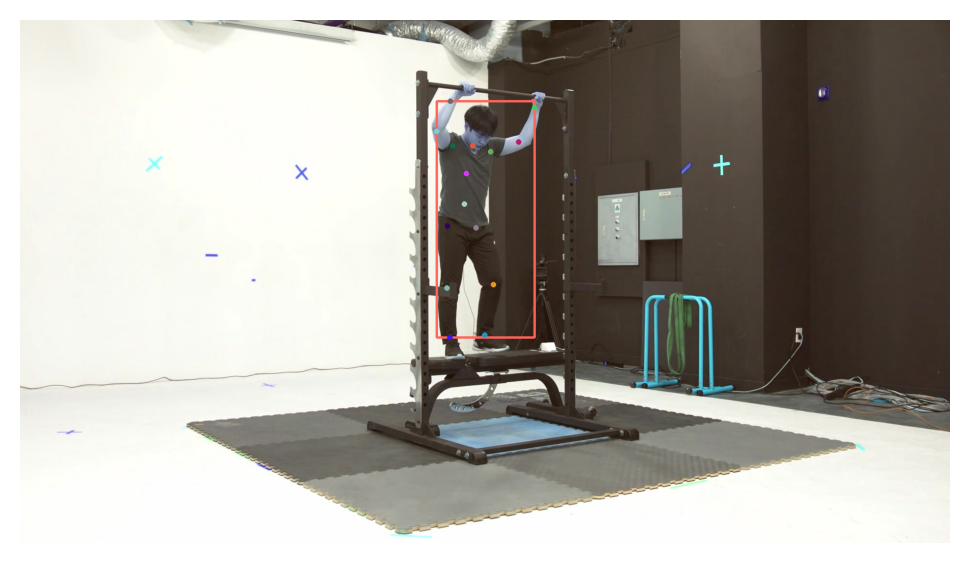

800
974 412 1174 877


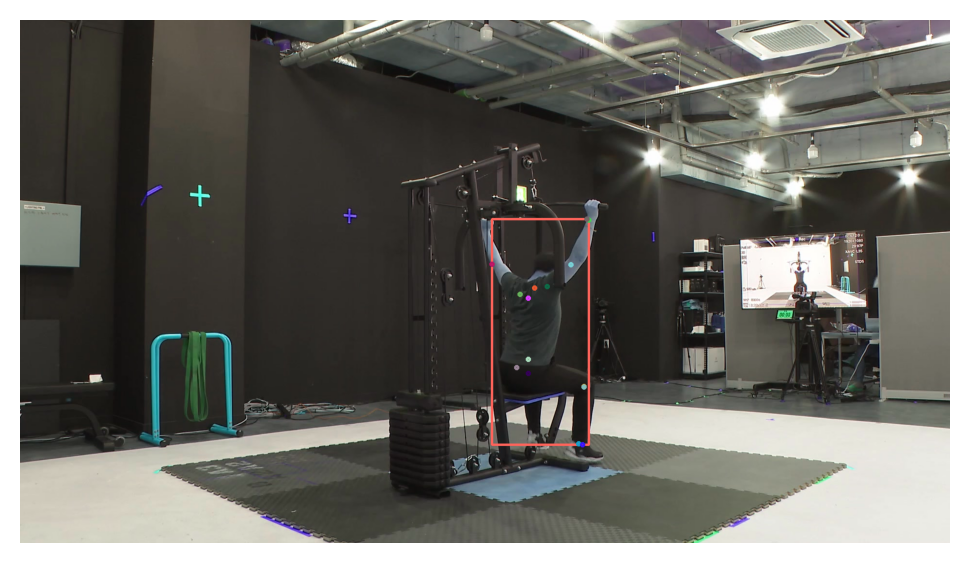

850
869 444 1079 851


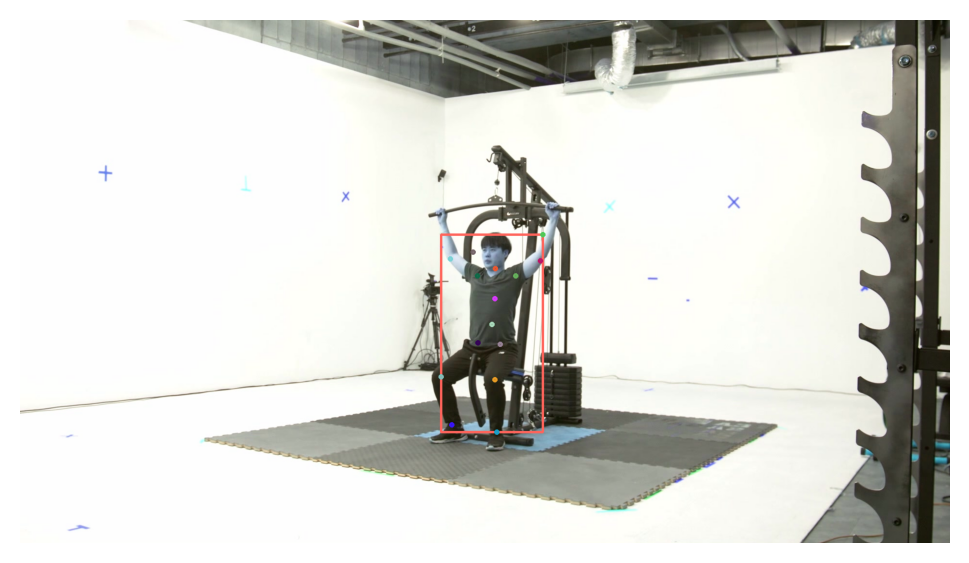

900
920 391 1181 846


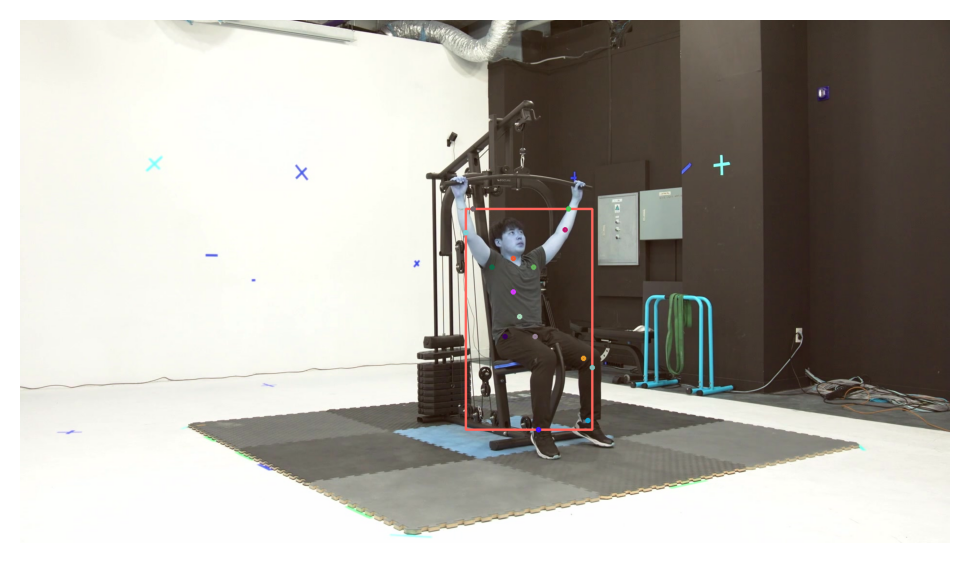

950
777 518 1024 865


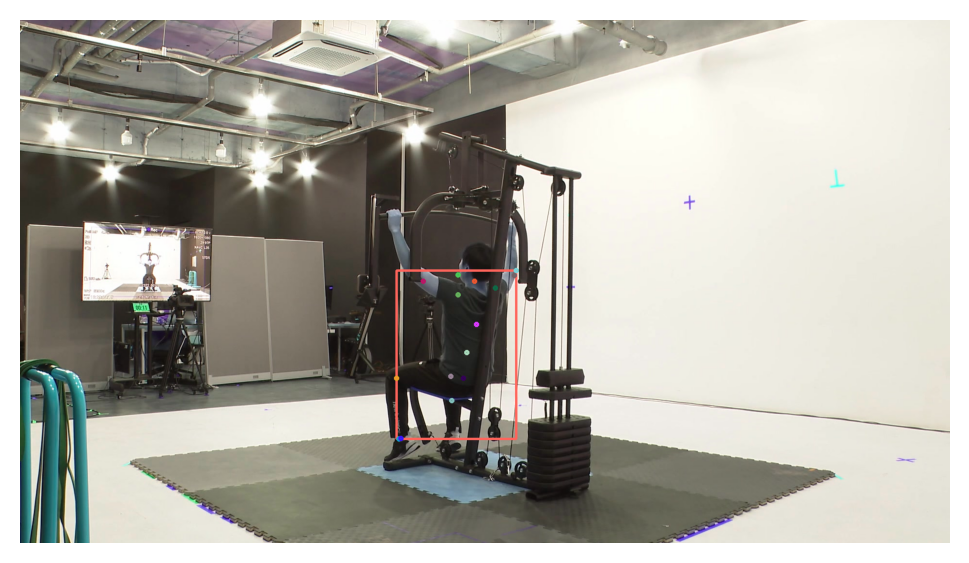

1000
873 412 1007 962


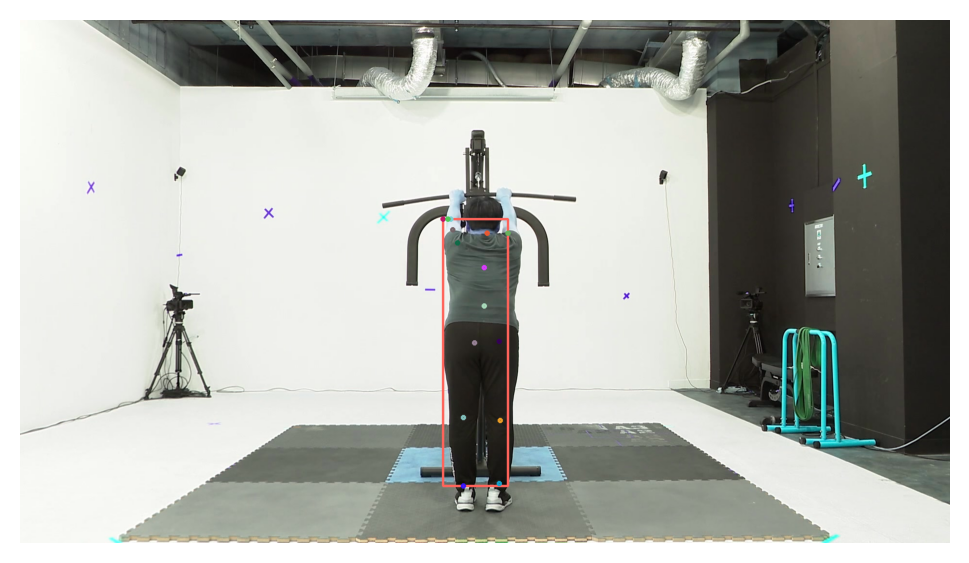

1050
1157 456 1254 858


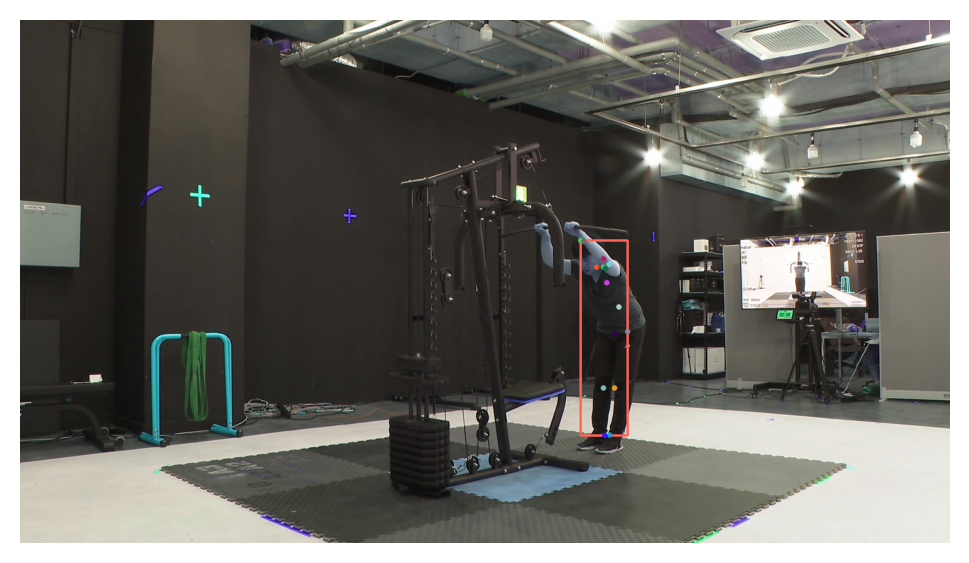

1100
780 408 974 875


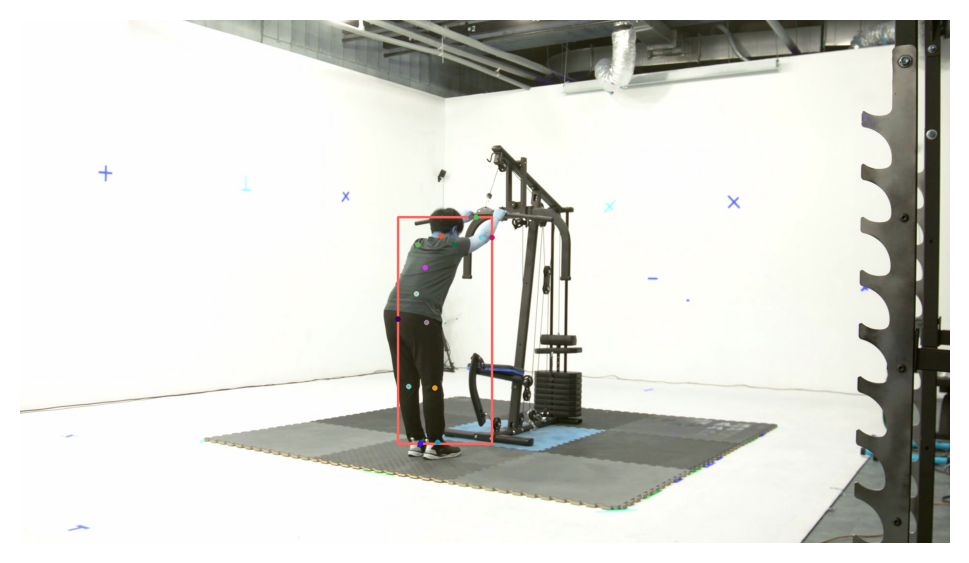

1150
1030 426 1216 887


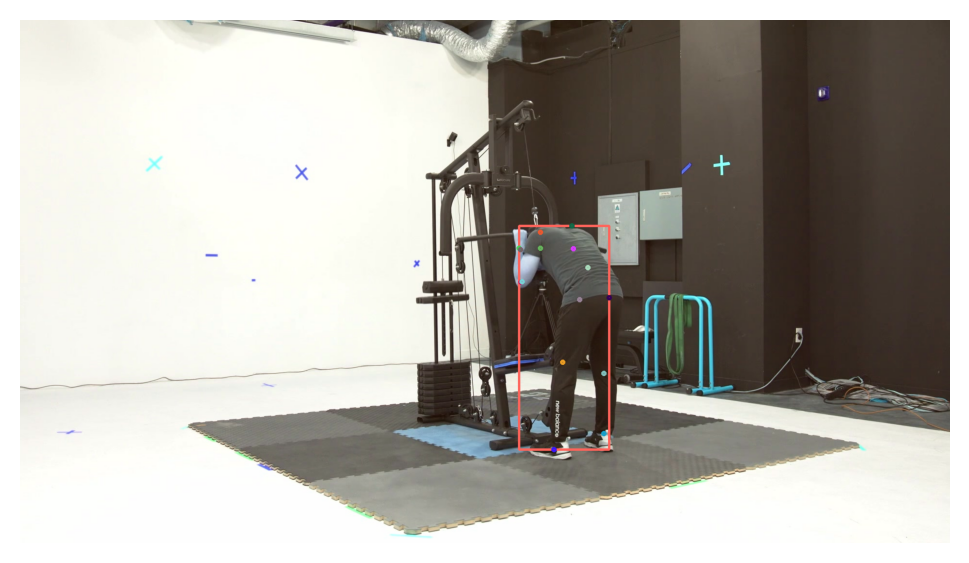

1200
1036 521 1199 888


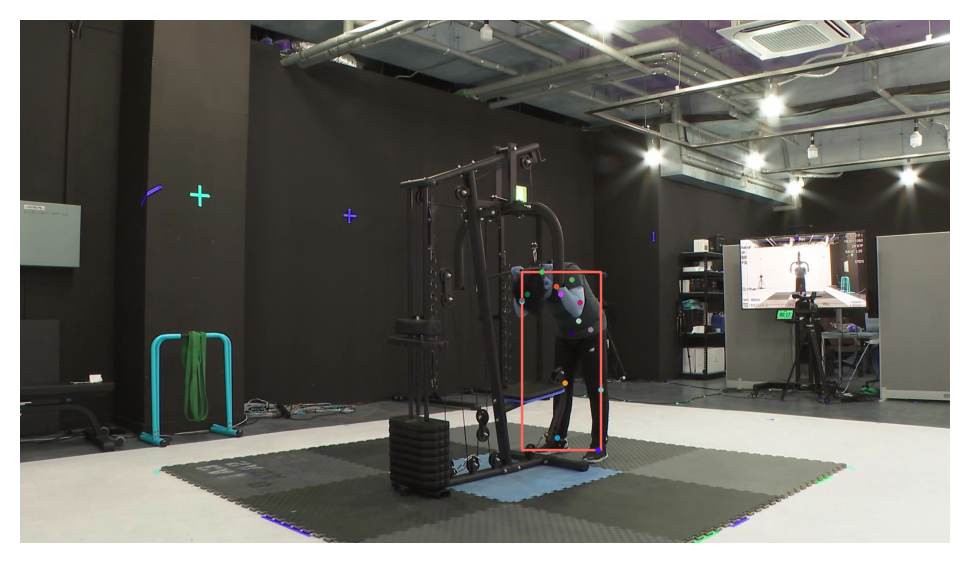

1250
856 553 1020 861


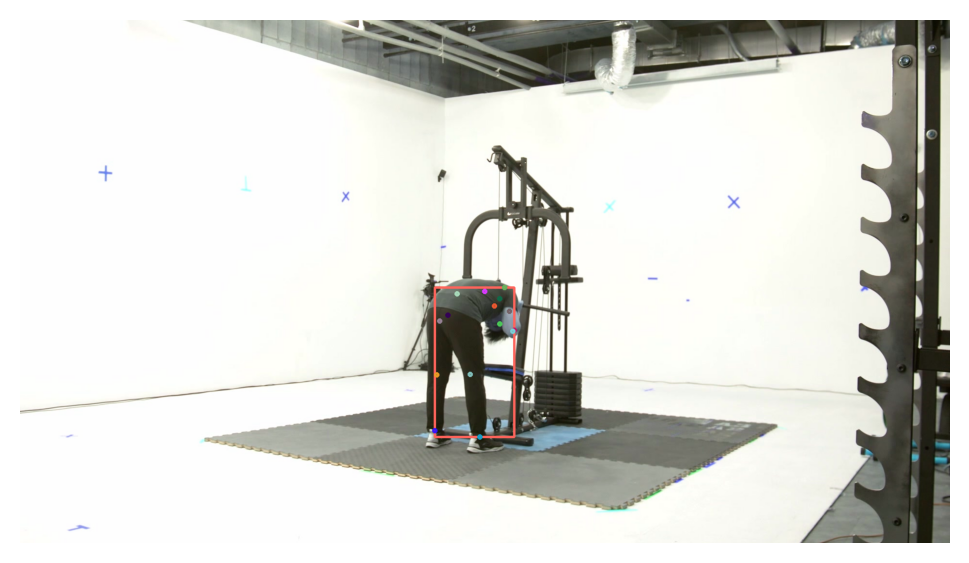

1300
1015 386 1202 860


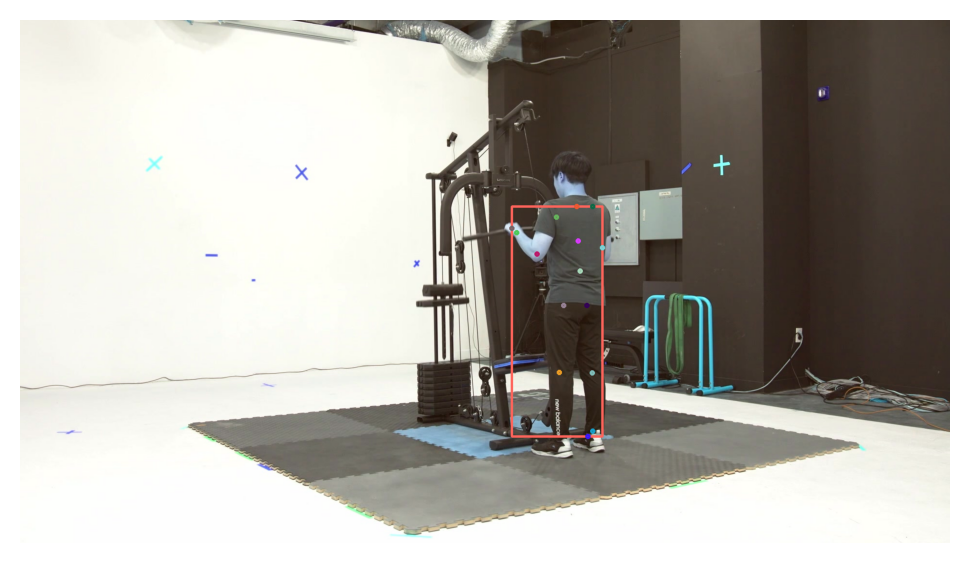

1350
725 439 879 874


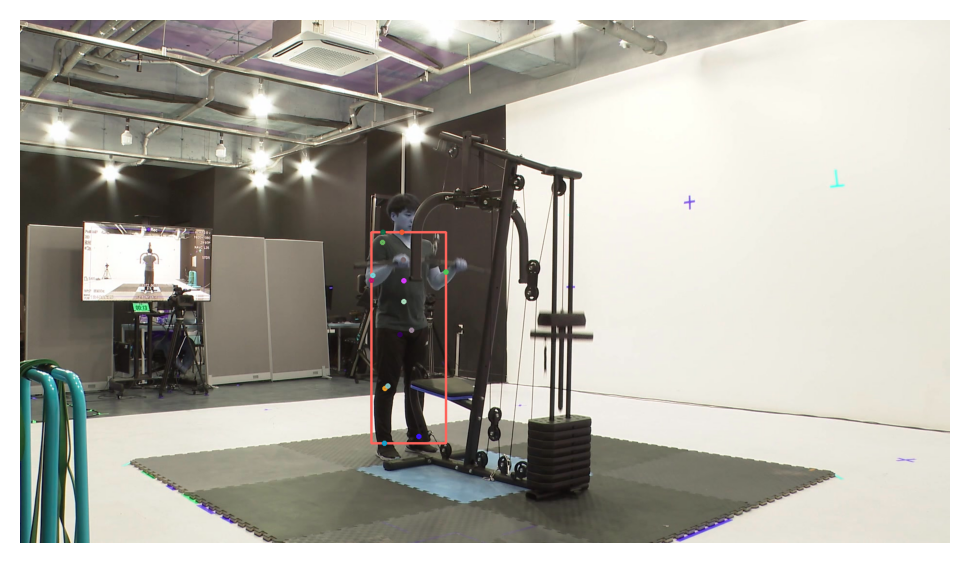

1400
833 408 1094 927


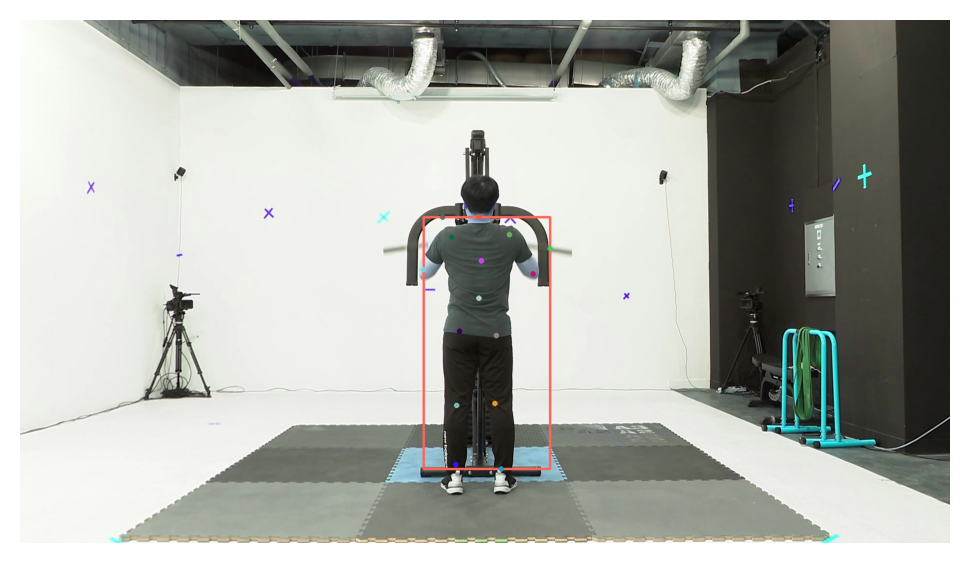

1450
706 610 931 873


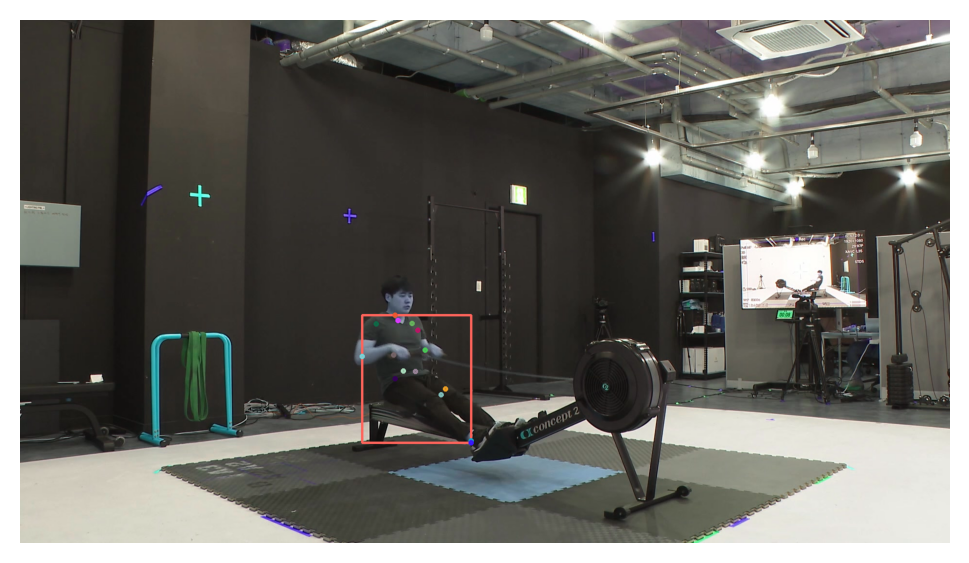

1500
976 591 1302 782


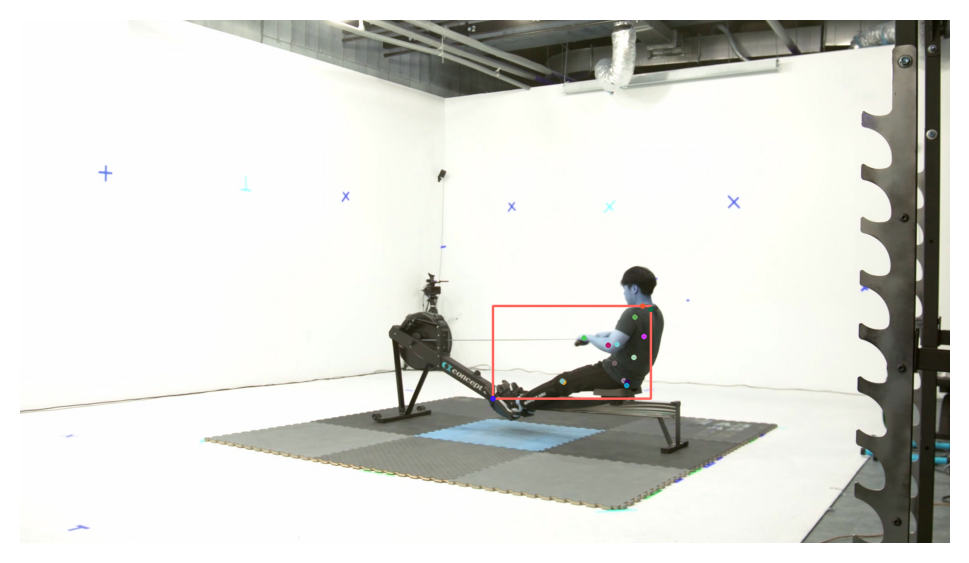

1550
968 546 1139 786


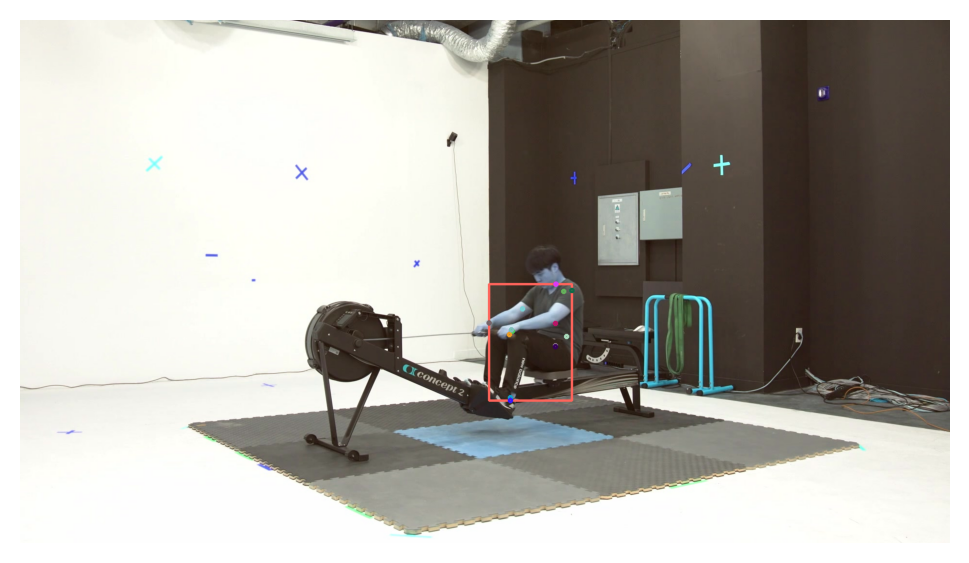

In [19]:
# submission file 
images_name = []
predicted = []
device = "cuda:0"

best_model.eval()
best_model.to(device)

path = './data/test_imgs/'
i=0
with torch.no_grad():
  for img_name in submission['image']:
    image = cv2.imread(path + img_name, cv2.COLOR_BGR2RGB)

    image = image / 255.0
    image = image.transpose(2, 0, 1)
    image = [torch.as_tensor(image, dtype=torch.float32, device=device)]

    Motionpreds = best_model(image)
    
    try : 
      Motionkeypoints = Motionpreds[0]['keypoints'].cpu().detach().numpy().copy()[0]
      
    except :
      print(img_name)
      print("predicted value is empty. \n")

    images_name.append(img_name)
    Motionkeypoints2 = Motionkeypoints[:, :2].copy()

    image = cv2.imread(path + img_name, cv2.COLOR_BGR2RGB)
    if i % 50 == 0 :
      print(i)
      draw_keypoints(image, Motionkeypoints2, [], edges)
    i=i+1

    motion_keypoints = [item for sublist in Motionkeypoints2 for item in sublist]
    #print(flat_keypoints)
    predicted.append(motion_keypoints)

In [20]:
print(len(predicted)) 
print(len(images_name))

1600
1600


In [21]:
sub = pd.DataFrame(columns=submission.columns)

all_predictions = np.array(predicted)
sub['image'] = images_name
sub.iloc[motion_key] = all_predictions

sub.to_csv('./code/5CV-hr/sub_1fold_0404.csv', index=False)

ValueError: ignored

# FOLD 2

In [ ]:
# 5-CV 추가
# 참고 : https://dacon.io/competitions/official/235697/codeshare/2446?page=1&dtype=recent
num_epochs = 20
SEED = 403
lam=2**(-20)
device='cuda:0'

# cross validation을 적용하기 위해 KFold 생성
kfold = KFold(n_splits=5, shuffle=True, random_state=SEED)

# dirty_mnist_answer에서 train_idx와 val_idx를 생성
#best_models = [] # 폴드별로 가장 validation acc가 높은 모델 저장

for fold_index, (trn_idx, val_idx) in enumerate(kfold.split( train_all ),1):
    if fold_index == 2 :
      break

print(trn_idx)
print(val_idx)

# for fold_index, (trn_idx, val_idx) in enumerate(kfold.split( train_all ),1):

seed_everything(SEED)
print(f' == fold: {fold_index} == ')

# cuda cache 초기화
torch.cuda.empty_cache()

#train fold, validation fold 분할
trainset = train_all.iloc[trn_idx]
validset  = train_all.iloc[val_idx]

#Dataset 정의
train_data = MotionDataset(label_df=trainset, transforms=transform1)
valid_data = MotionDataset(label_df=validset, transforms=transform_val)

#DataLoader 정의
train_loader = DataLoader(train_data, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)
valid_loader = DataLoader(valid_data, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)

# 모델 선언
model = get_model()
model.to(device)# gpu에 모델 할당

optimizer = optim.SGD(model.parameters(), lr=1e-4, momentum=0.9, weight_decay=5e-4)
lr_sched = torch.optim.lr_scheduler.StepLR(optimizer, step_size=8, gamma=0.1)

valid_early_stop = 0
valid_best_loss = float('inf')

for epoch in range(num_epochs):  
  model.train()
  for i, (images, targets) in enumerate(train_loader):
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    optimizer.zero_grad()
    model.train()
    losses = model(images, targets)
    loss = sum(loss for loss in losses.values())
    
    L2=0
    for param in model.parameters():
      L2 += torch.norm(param, p=2)
      loss = loss + lam * L2

    loss.backward()
    optimizer.step()

    if (i+1) % 20 == 0:
      print(f'| epoch: {epoch} | Train loss: {loss.item():.4f}', end=' | ')
      for k, v in losses.items():
        print(f'{k[5:]}: {v.item():.4f}', end=' | ')
      print()
  
  # Learning rate 조절
  lr_sched.step()

  if epoch < 1 : 
    continue

  valid_loss_list = []
  for i, (images, targets) in enumerate(valid_loader):
    optimizer.zero_grad()
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
      
    with torch.no_grad():
      lossesV  = model(images, targets)
      lossV = sum(loss for loss in lossesV.values())
      L2=0
      for param in model.parameters():
        L2 += torch.norm(param,p=2)
      lossV = lossV + lam * L2

      valid_loss_list.append(lossV)

    if (i+1) % 20 == 0:
      print(f'| epoch: {epoch} | Valid loss: {lossV.item():.4f}', end=' | ')
      for k, v in lossesV.items():
        print(f'{k[5:]}: {v.item():.4f}', end=' | ')
      print()

  val_mean_loss = np.mean(valid_loss_list, dtype="float64")
  print(f' > VALIDATION SET LOSS MEAN : {val_mean_loss : .4f}')
  
  # 모델 저장
  # 성능 변화 없는 에폭 3번 반복 -> Early stopping
  if val_mean_loss  < valid_best_loss :
    best_model = model
    MODEL = f"resnet101_{SEED}"
    # 경로 설정 필요
    path = f"./model/5CV/SEED_{SEED}/"
    try: 
      os.mkdir(path)
    except:
      None 
    torch.save(best_model.state_dict(), f'{path}fold{fold_index}]_{MODEL}_{val_mean_loss:2.4f}_epoch_{epoch}.pth')

  # early stopping    
  if val_mean_loss < valid_best_loss:
    valid_best_loss = val_mean_loss
    valid_early_stop = 0
  else:
    valid_early_stop += 1
    if valid_early_stop >= EARLY_STOPPING_EPOCH:
      print("EARLY_STOPPING!!")
      break


# 폴드별로 가장 좋은 모델 저장
# best_models.append(best_model)

[   0    1    2 ... 6185 6186 6187]
[   5   10   18 ... 6171 6177 6181]
 == fold: 2 == 
| epoch: 0 | Train loss: 8.9950 | classifier: 0.1140 | box_reg: 0.0455 | keypoint: 8.0278 | objectness: 0.5833 | rpn_box_reg: 0.0359 | 
| epoch: 0 | Train loss: 8.6166 | classifier: 0.0859 | box_reg: 0.0193 | keypoint: 7.8605 | objectness: 0.4417 | rpn_box_reg: 0.0207 | 
| epoch: 0 | Train loss: 8.5607 | classifier: 0.0942 | box_reg: 0.0368 | keypoint: 7.8713 | objectness: 0.3451 | rpn_box_reg: 0.0247 | 
| epoch: 0 | Train loss: 8.4417 | classifier: 0.0384 | box_reg: 0.0006 | keypoint: 7.9461 | objectness: 0.2593 | rpn_box_reg: 0.0087 | 
| epoch: 0 | Train loss: 8.2633 | classifier: 0.0693 | box_reg: 0.0133 | keypoint: 7.7424 | objectness: 0.2346 | rpn_box_reg: 0.0150 | 
| epoch: 0 | Train loss: 8.0257 | classifier: 0.0762 | box_reg: 0.0145 | keypoint: 7.5294 | objectness: 0.2061 | rpn_box_reg: 0.0109 | 
| epoch: 0 | Train loss: 8.0615 | classifier: 0.0776 | box_reg: 0.0361 | keypoint: 7.5609 | obje

In [ ]:
# submission file 
images_name = []
predicted = []
device = "cuda:0"

best_model.eval()
best_model.to(device)

path = './data/test_imgs/'
i=0
with torch.no_grad():
  for img_name in submission['image']:
    image = cv2.imread(path + img_name, cv2.COLOR_BGR2RGB)

    image = image / 255.0
    image = image.transpose(2, 0, 1)
    image = [torch.as_tensor(image, dtype=torch.float32, device=device)]

    Motionpreds = best_model(image)
    
    try : 
      Motionkeypoints = Motionpreds[0]['keypoints'].cpu().detach().numpy().copy()[0]
      
    except :
      print(img_name)
      print("predicted value is empty. \n")

    images_name.append(img_name)
    Motionkeypoints2 = Motionkeypoints[:, :2].copy()

    image = cv2.imread(path + img_name, cv2.COLOR_BGR2RGB)
    if i % 50 == 0 :
      print(i)
      draw_keypoints(image, Motionkeypoints2, [], edges)
    i=i+1

    motion_keypoints = [item for sublist in Motionkeypoints2 for item in sublist]
    #print(flat_keypoints)
    predicted.append(motion_keypoints)

In [ ]:
sub = pd.DataFrame(columns=submission.columns)

all_predictions = np.array(predicted)
sub['image'] = images_name
sub.iloc[motion_key] = all_predictions

sub.to_csv('./code/5CV-hr/sub_2fold_0404.csv', index=False)

# FOLD 3

In [ ]:
# 5-CV 추가
# 참고 : https://dacon.io/competitions/official/235697/codeshare/2446?page=1&dtype=recent
num_epochs = 20
SEED = 403
lam=2**(-20)
device='cuda:0'

# cross validation을 적용하기 위해 KFold 생성
kfold = KFold(n_splits=5, shuffle=True, random_state=SEED)

# dirty_mnist_answer에서 train_idx와 val_idx를 생성
#best_models = [] # 폴드별로 가장 validation acc가 높은 모델 저장

for fold_index, (trn_idx, val_idx) in enumerate(kfold.split( train_all ),1):
    if fold_index == 3 :
      break

print(trn_idx)
print(val_idx)

# for fold_index, (trn_idx, val_idx) in enumerate(kfold.split( train_all ),1):

seed_everything(SEED)
print(f' == fold: {fold_index} == ')

# cuda cache 초기화
torch.cuda.empty_cache()

#train fold, validation fold 분할
trainset = train_all.iloc[trn_idx]
validset  = train_all.iloc[val_idx]

#Dataset 정의
train_data = MotionDataset(label_df=trainset, transforms=transform1)
valid_data = MotionDataset(label_df=validset, transforms=transform_val)

#DataLoader 정의
train_loader = DataLoader(train_data, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)
valid_loader = DataLoader(valid_data, batch_size=2, shuffle=True, num_workers=2, collate_fn=collate_fn)

# 모델 선언
model = get_model()
model.to(device)# gpu에 모델 할당

optimizer = optim.SGD(model.parameters(), lr=1e-4, momentum=0.9, weight_decay=5e-4)
lr_sched = torch.optim.lr_scheduler.StepLR(optimizer, step_size=8, gamma=0.1)

valid_early_stop = 0
valid_best_loss = float('inf')

for epoch in range(num_epochs):  
  model.train()
  for i, (images, targets) in enumerate(train_loader):
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    
    optimizer.zero_grad()
    model.train()
    losses = model(images, targets)
    loss = sum(loss for loss in losses.values())
    
    L2=0
    for param in model.parameters():
      L2 += torch.norm(param, p=2)
      loss = loss + lam * L2

    loss.backward()
    optimizer.step()

    if (i+1) % 20 == 0:
      print(f'| epoch: {epoch} | Train loss: {loss.item():.4f}', end=' | ')
      for k, v in losses.items():
        print(f'{k[5:]}: {v.item():.4f}', end=' | ')
      print()
  
  # Learning rate 조절
  lr_sched.step()

  if epoch < 1 : 
    continue

  valid_loss_list = []
  for i, (images, targets) in enumerate(valid_loader):
    optimizer.zero_grad()
    images = list(image.to(device) for image in images)
    targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
      
    with torch.no_grad():
      lossesV  = model(images, targets)
      lossV = sum(loss for loss in lossesV.values())
      L2=0
      for param in model.parameters():
        L2 += torch.norm(param,p=2)
      lossV = lossV + lam * L2

      valid_loss_list.append(lossV)

    if (i+1) % 20 == 0:
      print(f'| epoch: {epoch} | Valid loss: {lossV.item():.4f}', end=' | ')
      for k, v in lossesV.items():
        print(f'{k[5:]}: {v.item():.4f}', end=' | ')
      print()

  val_mean_loss = np.mean(valid_loss_list, dtype="float64")
  print(f' > VALIDATION SET LOSS MEAN : {val_mean_loss : .4f}')
  
  # 모델 저장
  # 성능 변화 없는 에폭 3번 반복 -> Early stopping
  if val_mean_loss  < valid_best_loss :
    best_model = model
    MODEL = f"resnet101_{SEED}"
    # 경로 설정 필요
    path = f"./model/5CV/SEED_{SEED}/"
    try: 
      os.mkdir(path)
    except:
      None 
    torch.save(best_model.state_dict(), f'{path}fold{fold_index}]_{MODEL}_{val_mean_loss:2.4f}_epoch_{epoch}.pth')

  # early stopping    
  if val_mean_loss < valid_best_loss:
    valid_best_loss = val_mean_loss
    valid_early_stop = 0
  else:
    valid_early_stop += 1
    if valid_early_stop >= EARLY_STOPPING_EPOCH:
      print("EARLY_STOPPING!!")
      break


# 폴드별로 가장 좋은 모델 저장
# best_models.append(best_model)

In [ ]:
# submission file 
images_name = []
predicted = []
device = "cuda:0"

best_model.eval()
best_model.to(device)

path = './data/test_imgs/'
i=0
with torch.no_grad():
  for img_name in submission['image']:
    image = cv2.imread(path + img_name, cv2.COLOR_BGR2RGB)

    image = image / 255.0
    image = image.transpose(2, 0, 1)
    image = [torch.as_tensor(image, dtype=torch.float32, device=device)]

    Motionpreds = best_model(image)
    
    try : 
      Motionkeypoints = Motionpreds[0]['keypoints'].cpu().detach().numpy().copy()[0]
      
    except :
      print(img_name)
      print("predicted value is empty. \n")

    images_name.append(img_name)
    Motionkeypoints2 = Motionkeypoints[:, :2].copy()

    image = cv2.imread(path + img_name, cv2.COLOR_BGR2RGB)
    if i % 50 == 0 :
      print(i)
      draw_keypoints(image, Motionkeypoints2, [], edges)
    i=i+1

    motion_keypoints = [item for sublist in Motionkeypoints2 for item in sublist]
    #print(flat_keypoints)
    predicted.append(motion_keypoints)

In [ ]:
sub = pd.DataFrame(columns=submission.columns)

all_predictions = np.array(predicted)
sub['image'] = images_name
sub.iloc[motion_key] = all_predictions

sub.to_csv('./code/5CV-hr/sub_3fold_0404.csv', index=False)